***
# <center>Geometric multigrid method in 1 & 2 Dimensions</center> 
#### <center> Student. Benhari Abdessalam </center>
#### <center> Mines Paristech - January 2021 </center>
#### <center> Project notebook </center>
***

## Introduction :
The aim of this notebook is to try to solve some specific partial equations in 1 and 2 dimension, starting from the Poisson equation on a 1D space and ending with ana anistropic one on a 2D space.
This notebook is then devided into various subsections as follows:
### 1. Problem modelisation :
#### i. discretisation (Finite difference method):
- 1D Poisson's Equation : ($-\Delta u(x) = f(x) $)
- 2D isotropic Equation : $(-\Delta u(x,y) +\gamma u(x,y) = f(x,y))$
- 2D anistropic Equation : $(-du(x,y)/dx² -\epsilon  du(x,y)/dy² = f(x,y))$
#### ii. Laplacians construction (1D, 2D and 2D anistropic).
### 2. Linear solvers implementation :
- Jacobi Over Relaxation (JOR).
- Successive Over Relaxation (SOR).
### 3. Multigrid method implementation :
- Projection/Restriction matrix implementation (I).
- V-Cycle multigrid implementation.
- W-Cycle multigrid implementation.
### 4. Results :
- Plotting the different solvers results.
- Analysis and comparison over different values of some parameters.
____
### > Preliminary functions & imports :

In [238]:
# import the necessary libraries :
from math import pi, sin, cos, sqrt, sinh 
import pylab as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

In [49]:
# Initial (default) parameters :
_eps = 1e-12
_maxiter = 500
_n = 63

In [318]:
# Basic check functions :
def _basic_check(A, b, x0):
    """ Common check for clarity """
    n, m = A.shape
    if(n != m):
        raise ValueError("Only square matrix allowed")
    if(b.size != n):
        raise ValueError("Bad rhs size")
    if (x0 is None):
        x0 = np.zeros(n)
    if(x0.size != n):
        raise ValueError("Bad initial value size")
    return x0

def _basic_check_VCycle(A, u0, B, l):
    """ Common check for shapes compatibility """
    n, m = A.shape
    if (n != m):
        raise ValueError("A should be square")
    elif (n != u0.size) or (n != B.size):
        raise ValueError("B, u0 and A should have the same length")
    elif (u0.size//(2*l) <= 1):
        raise ValueError("l is very big, try {} or less".format((1/6)*u0.size - 1))

def _basic_check_WCycle(A, u0, B, l, s):
    """ Common check for shapes compatibility """
    n, m = A.shape
    if (n != m):
        raise ValueError("A should be square")
    elif (n != u0.size) or (n != B.size):
        raise ValueError("B, u0 and A should have the same length")
    elif (u0.size//(2*l) <= 1):
        raise ValueError("l is very big, try {} or less".format((1/6)*u0.size - 1))
    if (l < s):
        raise ValueError("l should be bigger than or equal m !")

___
## 1. Problem modelisation :
i. discretisation (Finite difference method):
- 1D Poisson's Equation : ($-\Delta u(x) = f(x) )$:
#### For a first degree Laplacian, the previous equation can be writte as follows : 
#### <center> $-d²u(x)/dx² = f(x)$ with $u(x) = 0$ at $\delta \Omega$ $(1)$ </center> 
Using the Taylor's polynomial derivation and the finite difference method with $h=1/n$ as a step, (1) becomes :
#### <center> $-(u(x+h)-2u(x)+u(x-h))/h² = f(x)$</center>
and for n unknows $(x_1, x_2, ..., x_n)$ such as $x_{i+1} = x_i + h $ we write $(1)$ using a $(u_i)_{i>=1}$ sequence $(u_i = u(x_i)$ and $f(x_i)=f_i )$ :
#### <center> $-(u_{i+1}-2u_i+u_{i-1})/h² = f_i)$ knowing that $u_0 = u_n = 0 $ (using the boundary conditions)</center>
The Laplacian matrix $A$ (with $Au = f$) will then -for the inner points- be written as follows : 
$A= (n-1)². \begin{bmatrix}
2 & -1 & ... & ...& 0 & \\
-1 & 2 & -1 & ... & . & \\
. & . & ... & .& . & \\
. & . & -1 & 2 & -1 & \\
0 & . & . & -1 & 2 & 
\end{bmatrix}$
#### The algorithms that'll create $A$ is then :


In [51]:
# Laplacian generator (1D) :
def laplace_1D(n):
    """ Constructs the 1D laplace operator
        for n unknowns (for our specific equation) """
    A = np.zeros((n,n))
    # TODO: Some work here
    A[0][0],A[0][1] = 2, -1
    A[n-1][n-1],A[n-1][n-2] = 2, -1
    for i in range(1,n-1):
        A[i][i], A[i][i-1], A[i][i+1] = 2, -1, -1
    A *= (n-1)**2
    return A

- 2D isotropic Equation : $(-\Delta u(x,y) +\gamma u(x,y) = f(x,y))$ $(2)$:
#### We proceed the same as the 1D case, but on booth axis ($x$ and $y$). $(2)$ then can be modelised as :
#### <center> $(-(u_{i,j+1}-2u_{i,j}+u_{i,j-1})/h²-(u_{i+1,j}-2u_{i,j}+u_{i-1,j})/h²+ \gamma u{i,j} = f_i)$ knowing that $u_{0,i} = u_{i,0} = 0$ $\forall i=1,n-1$ & $u_{0,0}=u_{n,n} = 0 $  (using the boundary conditions) \begin{matrix}
. & -- & u_{i,j+1} & -- &.\\
 |&   & | &  & | \\
u_{i-1,j} & -- & u_{i,j} & -- & u_{i+1,j}\\
|&   & | &  & | \\
. & -- & u_{i,j-1} & -- & .
\end{matrix} </center>

 From which we extract the laplacian matrix $(n²*n²)$ $A$ : <center>
 
 $A= (n-1)². \begin{bmatrix}
4+\gamma/(n-1)² & -1 & ...& -1 & ...& 0 & \\
-1 & 4+\gamma/(n-1)² & -1 & ... & -1 & . & \\
. & . & ... & ... & .& . & \\
. & . & ... & ... & .& . & \\
. & -1 & ... & -1 & 4+\gamma/(n-1)² & -1 & \\
0 & ... & -1 & ... & -1 & 4+\gamma/(n-1)² & 
\end{bmatrix}$ </center>

#### The algorithms that'll create $A$ is then :



In [308]:
# Laplacian generator (2D) :
def laplace_2D(n, gamma):
    """ Constructs the 2D laplace operator
        for our specified equation """
    A = np.zeros((n**2,n**2))
    # TODO: Some work here
    A[0][0],A[0][1], A[0][n] = 4, -1, -1
    A[n**2-1][n**2-1], A[n**2-1][n**2-2], A[n**2-1][n**2-n-1] = 4, -1, -1
    for i in range(1,n**2-1):
        if i < n:
            A[i][i], A[i][i-1], A[i][i+1], A[i][i+n] = 4, -1, -1, -1
        elif i >= n*(n-1):
            A[i][i], A[i][i-1], A[i][i+1], A[i][i-n] = 4, -1, -1, -1
        else:
            A[i][i], A[i][i-1], A[i][i+1], A[i][i-n], A[i][i+n] = 4, -1, -1, -1, -1              
    A *= (n-1)**2
    A += gamma*np.identity((n)**2)
    return A

- 2D anistropic Equation : $(-du(x,y)/dx² -\epsilon  du(x,y)/dy² = f(x,y))$
#### In the anisotropic case, the matrix A will be the same as before with a slight different affecting the $y$ axis:
$A= (n-1)². \begin{bmatrix}
2(1+\epsilon) & -1 & ...& -\epsilon & ...& 0 & \\
-1 & 2(1+\epsilon) & -1 & ... & -\epsilon & . & \\
. & . & ... & ... & .& . & \\
. & . & ... & ... & .& . & \\
. & -\epsilon & ... & -1 & 2(1+\epsilon) & -1 & \\
0 & ... & -\epsilon & ... & -1 & 2(1+\epsilon) & 
\end{bmatrix}$
#### The algorithms that'll create $A$ is then :

In [53]:
# Laplacian generator (2D-anisotropic) :
def laplace_2D_as(n, epsilon):
    """ Constructs the 2D laplace operator
        for our specified equation """
    A = np.zeros((n**2,n**2))
    # TODO: Some work here
    A[0][0],A[0][1], A[0][n] = 2*(epsilon + 1), -1, -epsilon
    A[n**2-1][n**2-1], A[n**2-1][n**2-2], A[n**2-1][n**2-n-1] = 2*(epsilon + 1), -1, -epsilon
    for i in range(1,n**2-1):
        if i < n:
            A[i][i], A[i][i-1], A[i][i+1], A[i][i+n] = 2*(epsilon + 1), -1, -1, -epsilon
        elif i >= n*(n-1):
            A[i][i], A[i][i-1], A[i][i+1], A[i][i-n] = 2*(epsilon + 1), -1, -1, -epsilon
        else:
            A[i][i], A[i][i-1], A[i][i+1], A[i][i-n], A[i][i+n] = 2*(epsilon + 1), -1, -1, -epsilon, -epsilon            
    A *= (n-1)**2
    return A

___
## 2. Linear solvers implementation :
To avoid any code repetition, i prefered to create one linear solver for both of JOR and SOR, which one to use can be specified over a parameter on the function.

In [54]:
def LS_solver(A, b, x0=None, method="JOR", omega=0.5, eps=_eps, maxiter=_maxiter):
    """
    A stationnary iterative method to approximately
    solve partial equations systems.
    - For the JOR, the preconditionner is M = (1./omega) * D
      with D the diagonal of A 
    L- For the SOR, the preconditionner is M = (1./omega) * D - E
      with D the diagonal of A and -E its upper tri. matrix. 
    Output:
        - x is the solution at convergence or after maxiter iteration
        - residual_history is a list of the norm of each residual.
    """
    # Residuals list over the whole iterations
    residual_history = list()
    
    # Some Parameters calculations
    x = _basic_check(A, b, x0)
    r = np.zeros(x.shape)
    z = np.ones(x.shape)
    
    # Calculates the M (precoditionner) Matrix     
    if method is "JOR":
        M = (1/omega)*np.diag(np.diag(A))
    elif method is "SOR":
        if (omega > 2.) or (omega < 0.):
            raise ArithmeticError("SOR will diverge")
        E = -np.tril(A, k=-1)
        M = ((1/omega)*np.diag(np.diag(A))) - E
    else:
        raise ValueError("""The chosen 'method' doesnt exist or not
                            taken into consideration""")
    
    # Iterates over i iterations until convergence
    iter = 0
    while ((iter < maxiter) and (np.linalg.norm(z) > eps)):
        r = b-A.dot(x)
        z = (np.linalg.inv(M)).dot(r)
        x += z
        residual_history.append(np.linalg.norm(r))
        iter+=1
    return x, residual_history

___
## 3. Multigrid method implementation :
- Projection/Restriction matrix implementation (I) :
#### Since we're going to use a full weight injection, the relationship between the fine grid (h) and the coarse grid(H) unknowns is the following :

\begin{matrix}
. & -- & v^h_{2i-1} & -- & v^h_{2i} & -- & v^h_{2i+1} & -- & . & ==> &. & -- & v^H_{i} (= 0.25v^h_{2i-1}+0.5v^h_{2i}+0.25v^h_{2i+1}) & -- & .
\end{matrix}

#### We then by writing that relationship as a matrix '$I^H_h$' $((n//2)*n)$ we get :

$I^H_h = 0.25. \begin{bmatrix}
1 & 2 & 1 & ...& ... & ... & 0 & 0 & \\
0 & 0 & 1 & 2 & 1 & 0 & ... & 0 & \\
. & . & ... & ...& ... & ... & . & . & \\
0 & ...& 0 & 1 & 2 & 1 & 0 & 0 & \\
0 & 0 & ... & ... &... & 1 & 2 & 1 & 
\end{bmatrix}$

And by the same manipulations we find $I^h_H$ : 

### <center> $I^h_H = 2.I^H_h$ </center>

We implement then one single Matrix $I$ that'll help switch from a coarse state to a fine one or vice-versa :

In [171]:
# Projection/Restriction Matrix (I) (1D full weight):
def I(n, to=None):
    """ Constructs the projection matrix if to="fine"
        and the restriction Matrix if to="coarse"
        for the 1D equation """
    n = int(n)
    I_mat = np.zeros((n//2 ,n))
    for i in range(n//2):
        I_mat[i][2*i+1], I_mat[i][2*i], I_mat[i][2*i+2] = 2, 1, 1
    if to is "coarse":
        return 0.25*I_mat
    elif to is "fine":
        return 0.5*I_mat.transpose()

#### For 2D, and after some calculations, we find that ((n//2)²*n²) $I^H_h(2D)$ in full-weight (fw) is :
$I^H_h(2D, fw) = (1/4). \begin{bmatrix}
I^H_h(1D) & 2I^H_h(1D) & I^H_h(1D) & ...& ... & ... & 0 & 0 & \\
0 & 0 & I^H_h(1D) & 2I^H_h(1D) & I^H_h(1D) & 0 & ... & 0 & \\
. & . & ... & ...& ... & ... & . & . & \\
0 & ...& 0 & I^H_h(1D) & 2I^H_h(1D) & I^H_h(1D) & 0 & 0 & \\
0 & 0 & ... & ... &... & I^H_h(1D) & 2I^H_h(1D) & I^H_h(1D) & 
\end{bmatrix}$  $= (0.25).(4I^H_h(1D) \otimes 4I^H_h(1D))$ 

#### And in half weight (hw):
$I^H_h(2D, hw) = (1/2). \begin{bmatrix}
I_{hw} & I^H_h(1D) & I_{hw} & ...& ... & ... & 0 & 0 & \\
0 & 0 & I_{hw} & I^H_h(1D) & I_{hw} & 0 & ... & 0 & \\
. & . & ... & ...& ... & ... & . & . & \\
0 & ...& 0 & I_{hw} & I^H_h(1D) & I_{hw} & 0 & 0 & \\
0 & 0 & ... & ... &... & I_{hw} & I^H_h(1D) & I_{hw} & 
\end{bmatrix}$  with $I_{hw}= (1/4).\begin{bmatrix}
0 & 1 & 0 & ...& ... & ... & 0 & 0 & \\
0 & 0 & 0 & 1 & 0 & 0 & ... & 0 & \\
. & . & ... & ...& ... & ... & . & . & \\
0 & ...& 0 & 0 & 1 & 0 & 0 & 0 & \\
0 & 0 & ... & ... &... & 0 & 1 & 0 & 
\end{bmatrix}$ 

And simultaniously that $I^h_H(2D, fw)$ and $I^h_H(2D, hw)$ are:

### <center> $I^h_H(2D, fw) = 4I^H_h(2D, fw)$ </center>
### <center> $I^h_H(2D, hw) = 2I^H_h(2D, hw)$ </center>

We then use the previous 1D implementation to implement the 2D version of the $I$ Matrix :

In [282]:
# Projection/Restriction Matrix (I) (2D full weight and half weight):
def I_2D(n, to=None, wmethod="fw"):
    """ Constructs the projection matrix if to="fine"
        and the restriction Matrix if to="coarse"
        for the 2D equation :
        - hw = half weight
        - fw = full weight """
    # Initial matrix
    I_mat = np.kron(4*I(n, to="coarse"),4*I(n, to="coarse"))

    # The full weight method
    if wmethod is "fw":
        if to is "coarse":
            return (1/16)*I_mat
        elif to is "fine":
            return (1/4)*I_mat.transpose()

    # the half weight method
    elif wmethod is "hw":
        I_mat = np.where(I_mat==1, 0, I_mat)
        I_mat = np.where(I_mat==2, 1, I_mat)
        if to is "coarse":
            return (1/8)*I_mat
        elif to is "fine":
            return (1/4)*I_mat.transpose()
    else:
        raise ValueError("""The chosen 'wmethod' doesnt exist or not
                            taken into consideration""")

- V-Cycle multigrid implementation:
#### In each step of this '$l$' cycle, we construct a coarser matrix for the laplace operator, the unknowns and the residuals. We then repeat the process until we reach our iteration number $l$, then we invert the process. We use the different relationships below :

### <center> $A_h = I^H_h A_H I^h_H$ , $u_H = I^H_h u_h$, and $u_h = I^h_H u_H $ </center>

For this to work, the $n$ we choose should be like : $n = 2^{k+1} -1$  with $k \geq 1 \in \mathbb{N}.$ 

\begin{matrix}
iter_l & & & & & & & & iter_l\\
& \searrow &  & & & & & \nearrow & \\
& & ... &  & & &...\\
& & & \searrow & &\nearrow &  \\
& &  &  &iter_0  &&&
\end{matrix}

To get that outcome, we use the following recursive function :

In [301]:
def mgVcyc(A, u0, B, l=8, v1_iter=3, v2_iter=3, dim=1, wmethod="fw"):
    """ 
    Multi grid V-cycle:
        - A, B, u0: The equation parameters
        - l: number of coarsening iterations (l=1 ==> two grid method)
        - v1_iter, v2_iter: number of iterations at each pre/post-smoothing step
        - dim : dimension
        - wmethod : weighing method
    """
    # Check parameters shapes
    _basic_check_VCycle(A, u0, B, l)

    # Number of unknowns
    if dim == 2:
        n_inc_h = int(sqrt(u0.size))
    else:
        n_inc_h = u0.size
    n_inc_H = n_inc_h//2
    # construction of Laplace operator 
    A_h = A 
    if dim == 2:
        A_H = (I_2D(n_inc_h, to="coarse", wmethod=wmethod).dot(A_h)).dot(I_2D(n_inc_h, to="fine", wmethod=wmethod))
    else:
        A_H = (I(n_inc_h, to="coarse").dot(A_h)).dot(I(n_inc_h, to="fine"))

    # Initial guess     
    u = u0
    b_h = B

    # Pre-smoothing Relaxation
    u_s = LS_solver(A_h, b_h, x0=u, method="JOR", omega=0.5, eps=_eps, maxiter=v1_iter)[0]

    # calculate the defect
    d_h = b_h - A_h.dot(u_s)

    # Restriction with injection (full weight or half weight)
    if dim == 2:
        d_H = I_2D(n_inc_h, to="coarse", wmethod=wmethod).dot(d_h)
    else:
        d_H = I(n_inc_h, to="coarse").dot(d_h)
    # Solve on the coarse grid if l=1, repeat the process otherwise
    if l == 1:
        #v_H = LS_solver(A_H, d_H, x0=np.zeros(n_inc_H), method="JOR", omega=0.5, eps=_eps, maxiter=v2_iter)[0] 
        v_H = np.linalg.solve(A_H, d_H) #(direct solver)
    else:
        v_H = mgVcyc(A_H, np.zeros(n_inc_H**dim), d_H, l=l-1, v1_iter=3, v2_iter=3, dim=dim)

    # Prolongation
    if dim == 2:
        v_h = I_2D(n_inc_h, to="fine", wmethod=wmethod).dot(v_H)
    else:
        v_h = I(n_inc_h, to="fine").dot(v_H)
    # Update solution 
    u = u_s + v_h 

    # Post-smoothing Relaxation 
    u = LS_solver(A_h, b_h, x0=u, method="JOR", omega=0.5, eps=_eps, maxiter=v2_iter)[0]
    return u

- W-Cycle multigrid implementation:
#### In each step of this '$l$' cycle, we construct a coarser matrix for the laplace operator, the unknowns and the residuals. We then repeat the process until we reach our iteration number $m$, then we start two V-cycle processes, and finally we invert the process to get to our first fine grid :

For this to work, the $n$ we choose should be like : $n = 2^{k+1} -1$  with $k \geq 1 \in \mathbb{N}.$ 

\begin{matrix}
iter_l & & & & & & &&&& & & iter_l\\
& \searrow &  & & && (iter_m)  & & & & &  \nearrow & \\
& & ... &  & & &...& & & & ...\\
& & & \searrow & &\nearrow & & \searrow &&\nearrow\\
& &  &  &iter_0  &  & & & iter_0
\end{matrix}

To get that outcome, we use the following recursive function :

In [323]:
def mgWcyc(A, u0, B, l=8, m=2, v1_iter=3, v2_iter=3, dim=1, wmethod="fw"):
    """ 
    Multi grid W-cycle:
        - A, B, u0: The equation parameters
        - l: number of coarsening iterations (l=1 ==> two grid method)
        - v1_iter, v2_iter: number of iterations at each pre/post-smoothing step
        - dim : dimension
        - wmethod : weighing method
    """
    # Check parameters shapes
    _basic_check_WCycle(A, u0, B, l, m)

    # Number of unknowns
    if dim == 2:
        n_inc_h = int(sqrt(u0.size))
    else:
        n_inc_h = u0.size
    n_inc_H = n_inc_h//2
    # construction of Laplace operator 
    A_h = A 
    if dim == 2:
        A_H = (I_2D(n_inc_h, to="coarse", wmethod=wmethod).dot(A_h)).dot(I_2D(n_inc_h, to="fine", wmethod=wmethod))
    else:
        A_H = (I(n_inc_h, to="coarse").dot(A_h)).dot(I(n_inc_h, to="fine"))

    # Initial guess     
    u = u0
    b_h = B

    # Pre-smoothing Relaxation
    u_s = LS_solver(A_h, b_h, x0=u, method="JOR", omega=0.5, eps=_eps, maxiter=v1_iter)[0]

    # calculate the defect
    d_h = b_h - A_h.dot(u_s)

    # Restriction with injection
    if dim == 2:
        d_H = I_2D(n_inc_h, to="coarse", wmethod=wmethod).dot(d_h)
    else:
        d_H = I(n_inc_h, to="coarse").dot(d_h)

    # Start the double v-cycle if l=m, repeat the process otherwise
    if m != l:
        v_H = mgWcyc(A_H, np.zeros(n_inc_H**dim), d_H, l=l-1, m=m, v1_iter=3, v2_iter=3, dim=dim, wmethod=wmethod)
    else:
        v_H = mgVcyc(A_H, np.zeros(n_inc_H**dim), d_H, l=m, v1_iter=3, v2_iter=3, dim=dim, wmethod=wmethod)
        v_H = mgVcyc(A_H, np.zeros(n_inc_H**dim), v_H, l=m, v1_iter=3, v2_iter=3, dim=dim, wmethod=wmethod)

    # Prolongation
    if dim == 2:
        v_h = I_2D(n_inc_h, to="fine", wmethod=wmethod).dot(v_H)
    else:
        v_h = I(n_inc_h, to="fine").dot(v_H)

    # Update solution 
    u = u_s + v_h 

    # Post-smoothing Relaxation 
    u = LS_solver(A_h, b_h, x0=u, method="JOR", omega=0.5, eps=_eps, maxiter=v2_iter)[0]
    return u

___
## 1. Results :
### i. Linear solvers on high and low frequency in 1D $(u_0 = [sin(k.i \pi /n) / i=1,n-1])$

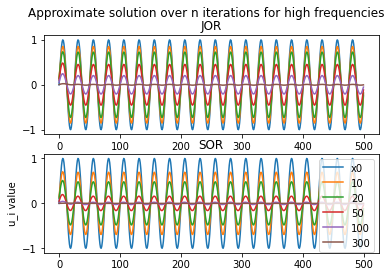

In [104]:
# Initiate parameters
_n =500
A = laplace_1D(_n)
b = np.zeros(_n)

# plotting the u evolution for various iteration steps on high frequencies
fig, axs = plt.subplots(2)
fig.suptitle('Approximate solution over n iterations for high frequencies')
for x in [0, 10, 20, 50, 100, 300]:
    x0 = np.array([sin(40*i*pi/_n) for i in range(0,_n)])
    axs[0].plot(LS_solver(A, b, x0=x0, method="JOR", omega=0.5, eps=_eps, maxiter=x)[0])
    axs[1].plot(LS_solver(A, b, x0=x0, method="SOR", omega=0.5, eps=_eps, maxiter=x)[0])

# Plot results
plt.legend(["x0", 10, 20, 50, 100, 300])
axs[0].set_title("JOR")
axs[1].set_title("SOR")
plt.ylabel("u_i value")
plt.show()

Text(0, 0.5, 'u_i value')

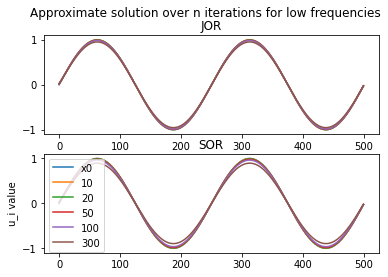

In [108]:
# plotting the u evolution for various iteration steps for low frequencies
fig, axs = plt.subplots(2)
fig.suptitle('Approximate solution over n iterations for low frequencies')
for x in [0, 10, 20, 50, 100, 300]:
    x0 = np.array([sin(4*i*pi/_n) for i in range(0,_n)])
    axs[0].plot(LS_solver(A, b, x0=x0, method="JOR", omega=0.5, eps=_eps, maxiter=x)[0])
    axs[1].plot(LS_solver(A, b, x0=x0, method="SOR", omega=0.5, eps=_eps, maxiter=x)[0])

# Plot results
plt.legend(["x0", 10, 20, 50, 100, 300])
axs[0].set_title("JOR")
axs[1].set_title("SOR")
plt.ylabel("u_i value")

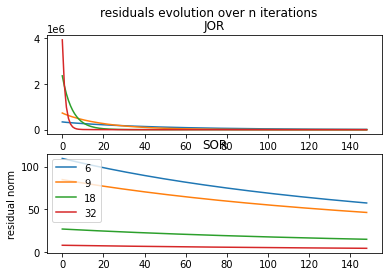

In [106]:
# plotting the residuals norm for various k values
fig, axs = plt.subplots(2)
fig.suptitle('residuals evolution over n iterations')
for x in [6, 9, 18, 32]:
    x0 = np.array([sin(x*i*pi/n) for i in range(_n)])
    axs[0].plot(LS_solver(A, b, x0=x0, method="JOR", omega=0.5, eps=_eps, maxiter=500)[1][1:150])
    axs[1].plot(LS_solver(A, b, x0=x0, method="SOR", omega=0.5, eps=_eps, maxiter=500)[1][1:150])

# Plot results
plt.legend([6, 9, 18, 32])
axs[0].set_title("JOR")
axs[1].set_title("SOR")
plt.ylabel("residual norm")
plt.show()

To be able to see the behavior of our linear solvers, we choose $f=0$ (to easily know the real solution for comparison, which is 0) and $u_0 = sin(k.i. \pi /n)$, we then varied the k value to build high and low frequency cases. Based on the previous plots we can clearly draw the following conclusions :
* The High frequency solutions are smoothened very fast (after a little number of iterations)
* The low frequency solutions Stay almost the same after up to 500 iterations which leads us to conclude that JOR and SOR aren't exactly suited for solving this kind of equations.
* We also see that SOR converges faster than JOR on the high frequency case.
### ii. Multigrid solvers in 1D for $(u_0 = [sin(k.i \pi /n) / i=1,n-1])$ and $f=0$ :
- The V-cycle multigrid method :

To not repeat the same code twice (*for the comparison between the linear solver and the linear smoother on the last step of the V_cycle*), I added a line that can be directly commented or uncommented for tests. After some tests I drew the following conclusion : The smoother on the last step behaves the same as the direct solver with a decent number of iterations ($l$), but if we stick to the two grid method for example ($l=2$) the direct sover gives a better and smoother solution (that said for the low frequencies but for the high frequencies it is almost the same). 

In the code below, we're plotting some comparison between the linear solvers and the multigrid V-cycle method on low and high frequencies :

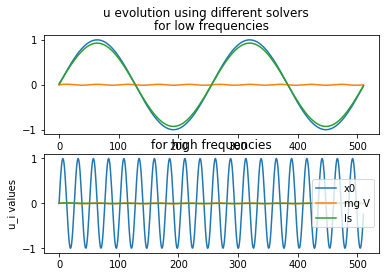

In [247]:
# Initial Parameters
_n =511
A = laplace_1D(_n)
b = np.zeros(_n)
# initial x0 (u0) values
x0_high = np.array([sin(40*i*pi/_n) for i in range(0,_n)])
x0_low = np.array([sin(4*i*pi/_n) for i in range(0,_n)])

# Plotting the results
fig, axs = plt.subplots(2)
fig.suptitle('u evolution using different solvers')

#for low frequencies
axs[0].plot(x0_low)
axs[0].plot(mgVcyc(A, x0, b, l=7, v1_iter=3, v2_iter=3))
axs[0].plot(LS_solver(A, b, x0=x0_low, method="JOR", omega=0.5, eps=_eps, maxiter=500)[0])
axs[0].set_title("for low frequencies")

#for high frequencies
axs[1].plot(x0_high)
axs[1].plot(mgVcyc(A, x0, b, l=7, v1_iter=3, v2_iter=3))
axs[1].plot(LS_solver(A, b, x0=x0_high, method="JOR", omega=0.5, eps=_eps, maxiter=500)[0])
axs[1].set_title("for high frequencies")

plt.legend(["x0", "mg V", "ls"])
plt.ylabel("u_i values")
plt.show()

We can see clearly from the plot above that the multigrid converges way faster than the classical linear solver especially on <b> _low_ </b> frequencies.

- The W-cycle multigrid method:

Let's now see how the W-cycle behaves compared to the linear solvers :

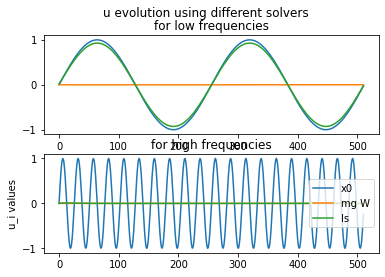

In [248]:
# Initial Parameters
_n =511
A = laplace_1D(_n)
b = np.zeros(_n)
# initial x0 (u0) values
x0_high = np.array([sin(40*i*pi/_n) for i in range(0,_n)])
x0_low = np.array([sin(4*i*pi/_n) for i in range(0,_n)])

# Plotting the results
fig, axs = plt.subplots(2)
fig.suptitle('u evolution using different solvers')

#for low frequencies
axs[0].plot(x0_low)
axs[0].plot(mgWcyc(A, x0, b, l=7, v1_iter=3, v2_iter=3))
axs[0].plot(LS_solver(A, b, x0=x0_low, method="JOR", omega=0.5, eps=_eps, maxiter=500)[0])
axs[0].set_title("for low frequencies")

#for high frequencies
axs[1].plot(x0_high)
axs[1].plot(mgWcyc(A, x0, b, l=7, v1_iter=3, v2_iter=3))
axs[1].plot(LS_solver(A, b, x0=x0_high, method="JOR", omega=0.5, eps=_eps, maxiter=500)[0])
axs[1].set_title("for high frequencies")

plt.legend(["x0", "mg W", "ls"])
plt.ylabel("u_i values")
plt.show()

As the plot above shows, the multigrid W-cycle also converges faster than the linear solver especially on low frequencies, and it even converges faster than the V-cycle multigrid.

### ii. Multigrid solvers in 2D for isotropic equations  $($with $u_0 = [ sin(k.j. \pi /n). \delta_{1,j} / i,j=1,n-1]$ and $f= [sinh(k.i. \pi /n).sin(k.j. \pi /n) / i,j=1,n-1] )$ :

- Initial case ($\gamma = 0$): 

Text(0.5, 0.92, 'V-cycle fw Result')

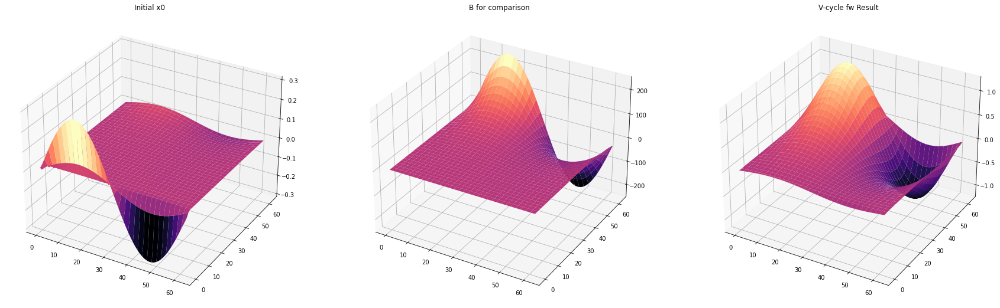

In [302]:
# Initial parameters
_n = 63
gamma = 0
A = laplace_2D(_n, gamma)
b = []
for i in range(0,_n):
    for j in range(0, _n):
        b.append(sinh(2*i*pi/_n)*sin(2*j*pi/_n))
b = np.array(b)
x0 = np.array([sin(2*i*pi/_n) for i in range(0,_n)] + [0]*_n*(_n-1))

# Plot the results :
B = np.reshape(b, (-1, _n))
X = np.arange(0, _n)
Y = np.arange(0, _n)
X, Y = np.meshgrid(X, Y)
Z0 = np.reshape(x0, (-1, _n))
Z = mgVcyc(A, x0, b, l=3, v1_iter=5, v2_iter=5, dim=2)
Z = np.reshape(Z, (-1, _n))

fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(1, 3, 1, projection='3d')
ax.plot_surface(X, Y, Z0, cmap='magma')
ax.set_title("Initial x0")

ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.plot_surface(X, Y, B, cmap='magma')
ax.set_title("B for comparison")

ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.plot_surface(X, Y, Z, cmap='magma')
ax.set_title("V-cycle fw Result")

As shown in the plot above, the multigrid V-cycle converges to the wanted solution (which should look like b (or f)).
- second case, various $\gamma $ and $n$ values :

let's now try to get the same solution with different $\gamma$ and $n$ values to see how the solution could be affected by those variations:

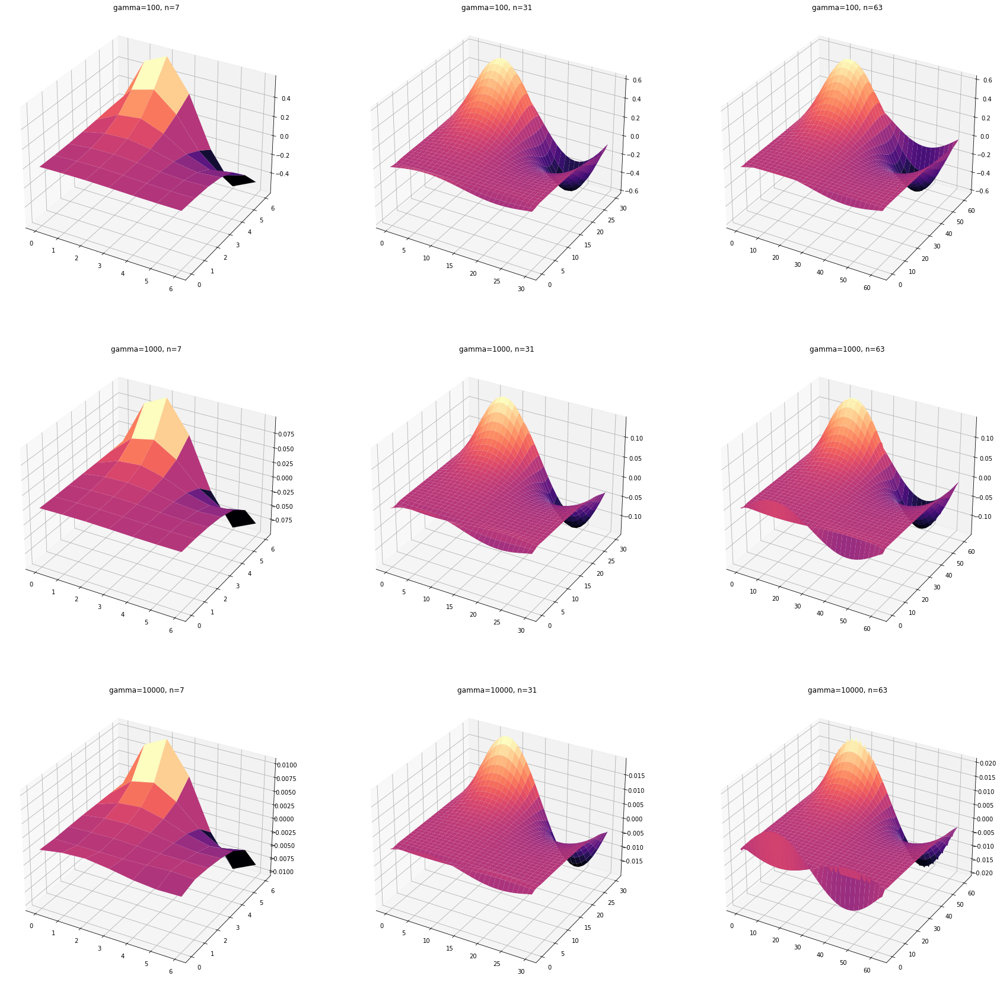

In [303]:
# setting figure parameters
fig = plt.figure(figsize=(30,30))

# Plotting the result for various gamma and n values
_n_list = [7, 31, 63]
gamma_list = [100, 1000, 10000]
for k in range(3):
    for l in range(3):
        _n = _n_list[k]
        gamma = gamma_list[l]
        A= laplace_2D(_n, gamma)
        b = []
        for i in range(0,_n):
            for j in range(0, _n):
                b.append(sinh(2*i*pi/_n)*sin(2*j*pi/_n))
        b = np.array(b)
        x0 = np.array([sin(2*i*pi/_n) for i in range(0,_n)] + [0]*_n*(_n-1))

        # Plot the results :
        X = np.arange(0, _n)
        Y = np.arange(0, _n)
        X, Y = np.meshgrid(X, Y)
        Z = mgVcyc(A, x0, b, l=2, v1_iter=5, v2_iter=5, dim=2)
        Z = np.reshape(Z, (-1, _n))

        ax = fig.add_subplot(3, 3, k+3*l+1, projection='3d')
        ax.plot_surface(X, Y, Z, cmap='magma')
        ax.set_title("gamma={0}, n={1}".format(gamma, _n))

If we look closely at the Z-values on the different plots above, we can draw a straightforward conclusion : The bigger the value of $\gamma$ compared to $n$ $(\gamma >> n)$ the closer the solution to the constant function $C=0$, which does make sense, because if we write our equation $(2)$ as : 

#### <center> $((1/\gamma).(\Delta u(x,y) +f(x,y))  = u(x,y))$ </center>

<b> then $\gamma \longrightarrow \infty$ $\implies u(x,y) \longrightarrow C=0$ </b> _($u(x,y)$ and $f(x, y)$ are bound fonctions on the the interval we choose)_.

- Comparison between the v-Cycle and W-Cycle on various $\gamma$ and $n$ :

(961,) (961, 961) (961,)
(961,) (961, 961) (961,)
(3969,) (3969, 3969) (3969,)
(3969,) (3969, 3969) (3969,)


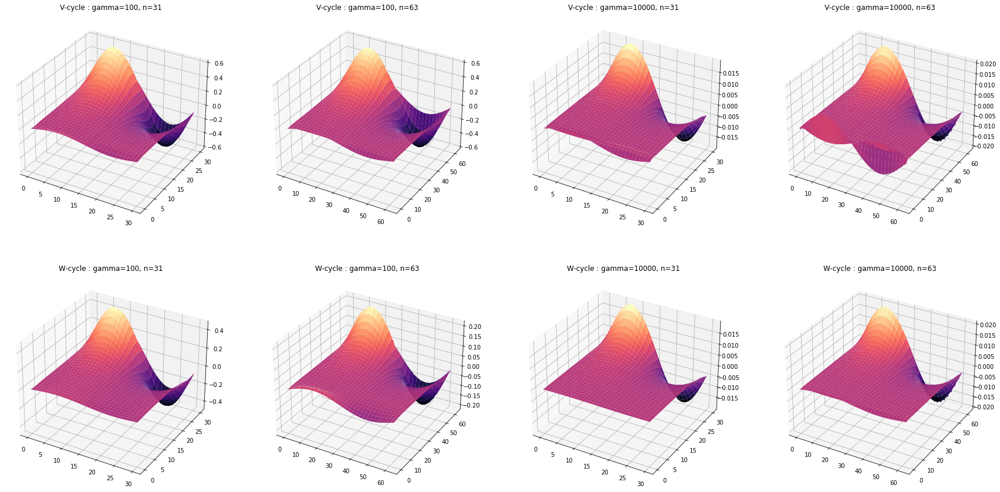

In [322]:
# setting figure parameters
fig = plt.figure(figsize=(30,15))

# Plotting the result for various gamma and n values
_n_list = [31, 63]
gamma_list = [100, 10000]
for k in range(2):
    for l in range(2):
        _n = _n_list[k]
        gamma = gamma_list[l]
        A= laplace_2D(_n, gamma)
        b = []
        for i in range(0,_n):
            for j in range(0, _n):
                b.append(sinh(2*i*pi/_n)*sin(2*j*pi/_n))
        b = np.array(b)
        x0 = np.array([sin(2*i*pi/_n) for i in range(0,_n)] + [0]*_n*(_n-1))

        # Plot the results :
        X = np.arange(0, _n)
        Y = np.arange(0, _n)
        X, Y = np.meshgrid(X, Y)
        # V-cycle result
        Z_V = mgVcyc(A, x0, b, l=3, v1_iter=5, v2_iter=5, dim=2)
        Z_V = np.reshape(Z_V, (-1, _n))
        # W-cycle result
        Z_W = mgWcyc(A, x0, b, l=3,m=2, v1_iter=5, v2_iter=5, dim=2)
        Z_W = np.reshape(Z_W, (-1, _n))

        ax = fig.add_subplot(2, 4, k+2*l+1, projection='3d')
        ax.plot_surface(X, Y, Z_V, cmap='magma')
        ax.set_title("V-cycle : gamma={0}, n={1}".format(gamma, _n))

        ax = fig.add_subplot(2, 4, k+2*l+5, projection='3d')
        ax.plot_surface(X, Y, Z_W, cmap='magma')
        ax.set_title("W-cycle : gamma={0}, n={1}".format(gamma, _n))

The conclusion we can draw from this comparison is that the W-cycle converges smoother that the V-cycle and gets affected by the $\gamma$ value more than the V-cycle (which means it converges to the $C=0$ faster when $\gamma$ gets bigger).

- half weight and full weight injection comparison on V-cycle multigrid :

To compare the half weight and the full weight injection methods, we plotted these two using the V-cycle multigrid below :

Text(0.5, 0.92, 'The half weight method')

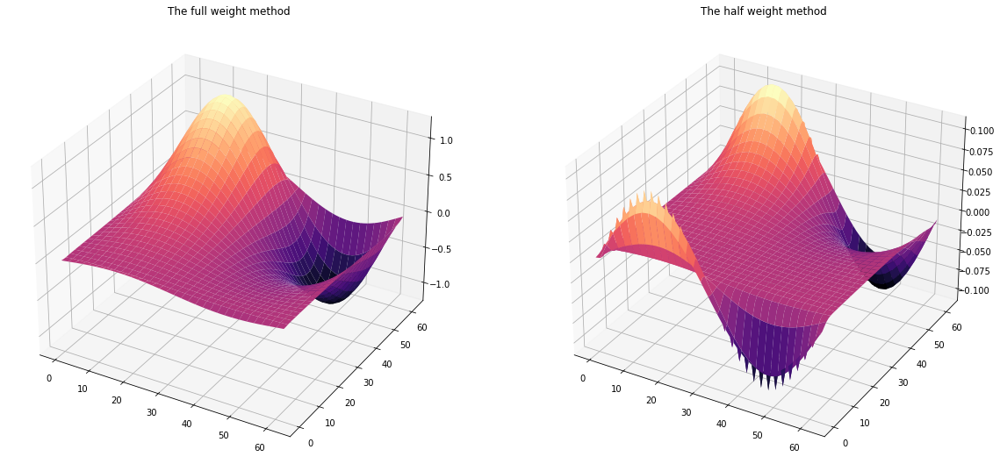

In [324]:
# setting figure parameters
fig = plt.figure(figsize=(20,10))

# Initial parameters
_n = 63
gamma = 0
A = laplace_2D(_n, gamma)
b = []
for i in range(0,_n):
    for j in range(0, _n):
        b.append(sinh(2*i*pi/_n)*sin(2*j*pi/_n))
b = np.array(b)
x0 = np.array([sin(2*i*pi/_n) for i in range(0,_n)] + [0]*_n*(_n-1))

# Plot the results :
X = np.arange(0, _n)
Y = np.arange(0, _n)
X, Y = np.meshgrid(X, Y)
# full weight result
Z_fw = mgVcyc(A, x0, b, l=3, v1_iter=5, v2_iter=5, dim=2, wmethod="fw")
Z_fw = np.reshape(Z_fw, (-1, _n))
# half weight result
Z_hw = mgVcyc(A, x0, b, l=3, v1_iter=5, v2_iter=5, dim=2, wmethod="hw")
Z_hw = np.reshape(Z_hw, (-1, _n))

ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.plot_surface(X, Y, Z_fw, cmap='magma')
ax.set_title("The full weight method")

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(X, Y, Z_hw, cmap='magma')
ax.set_title("The half weight method")

In this case, the half weight clearly doesn t converge better than the full weight, and we can also see that a lot of information is lost throughout the process. But that depends on many parameters (the equation, the mesh we choose, etc.), we can say that it isn't the right one for our case, but we can absolutely <b>not</b> say that it isn't efficient overall (in some cases it is better to choose the half weight to get a faster result)

### iii. Multigrid solvers in 2D for anisotropic equations :

To see how the convergence is affected by the value of epsilon in the anisotropic equation, we take $f=0$ and  $u_0 = [ sin(k.i. \pi /n).sin(k.j. \pi /n) / i,j=1,n-1]$, we then vary the epsilon value and plot the results shown below :

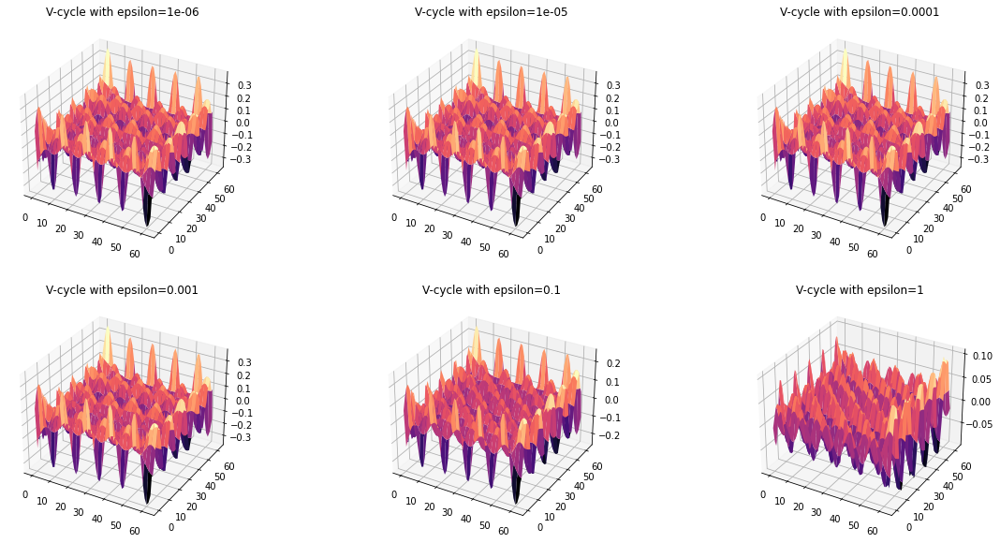

In [344]:
# setting figure parameters
fig = plt.figure(figsize=(20,10))

# Plotting the result for various epsilon values
_n = 63
epsilon_list = [0.000001, 0.00001, 0.0001, 0.001, 0.1, 1]
for e in range(6):
    epsilon = epsilon_list[e]
    A = laplace_2D_as(_n, epsilon)
    x0 = []
    for i in range(0,_n):
        for j in range(0, _n):
            x0.append(cos(10*i*pi/_n)*sin(10*j*pi/_n))
    x0 = np.array(x0)
    b = np.zeros(_n**2)

    # Plot the results :
    X = np.arange(0, _n)
    Y = np.arange(0, _n)
    X, Y = np.meshgrid(X, Y)
    # full weight result
    Z = mgVcyc(A, x0, b, l=3, v1_iter=5, v2_iter=5, dim=2)
    Z = np.reshape(Z, (-1, _n))

    ax = fig.add_subplot(2, 3, e+1, projection='3d')
    ax.plot_surface(X, Y, Z, cmap='magma')
    ax.set_title("V-cycle with epsilon={}".format(epsilon))


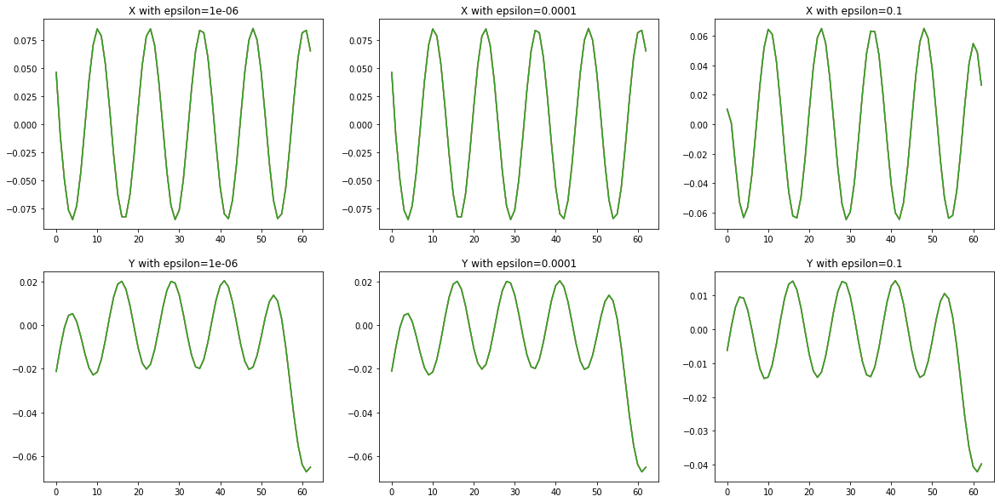

In [362]:
# setting figure parameters
fig = plt.figure(figsize=(20,10))

# Plotting the result for various epsilon values
_n = 63
epsilon_list = [0.000001, 0.0001,0.1]
for e in range(3):
    epsilon = epsilon_list[e]
    A = laplace_2D_as(_n, epsilon)
    x0 = []
    for i in range(0,_n):
        for j in range(0, _n):
            x0.append(cos(10*i*pi/_n)*sin(10*j*pi/_n))
    x0 = np.array(x0)
    b = np.zeros(_n**2)

    # Plot the results :
    Z = [np.reshape(LS_solver(A, b, x0=x0, method="JOR", omega=0.5, eps=_eps, maxiter=x)[0],(-1, _n))  for x in [0,10,50]]
    ax = fig.add_subplot(2, 3, e+1)
    for z in Z:
        ax.plot(z[:,1])
        ax.set_title("X with epsilon={}".format(epsilon))
    ax = fig.add_subplot(2, 3, e+4)
    for z in Z:
        ax.plot(z[1,:])
        ax.set_title("Y with epsilon={}".format(epsilon))


On the plots below, one axis looks smoother than the other when $\epsilon << 1$ (the smoothing affects only the x-axis, the y-axis value is almost non existent). So for an optimal solution, it may be better to choose another smoother (other than the ones we used in this practical work) or to apply what so-called a semi-coarsening (a coarsening on only one direction).

___
<p style='text-align: left;'>Abdessalam Benhari</p> <p style='text-align: right;'> 17.01.2021  </p>

___